In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors
import scanpy as sc
import pandas as pd
import seaborn as sns
import scipy as sp
import numpy as np
import torch
from rich import print


# Define the path to the directory you want to change to
new_directory = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/H2M_sysVI/H2M_oligo/'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

In [2]:
#### NEW COLORS FOR PLOTTING GENE EXPRESSION ON UMAPS

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import scanpy as sc

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=12) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/H2M_sysVI/H2M_oligo/figures/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


# Set up nomenclature

In [ ]:
#adata = sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/sysVI_mdata_OL_LABELED.h5ad')
#adata

In [26]:
adata = sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/sysVI_mdata_OL_working_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 245225 × 32250
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 's_score', 'g2m_score', 'phase', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'cell_cycle_diff', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'treatment_min', 'system_map', 'sys_leiden_1', 'sys_leiden_1.5', 'sys_leiden_2', 'cell_type_abbrev', 'treatment_meta', 'indiv_treatment_time', 'pub_treatment_lesion', 'lesion_status', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_

In [27]:
pd.set_option('display.max_columns', 500)
adata.obs[:5]

,sample_id,publication,sample_id_anon,individual_id_anon,replicate,treatment,condition,tissue,time,batch,lesion_type,sample_source,diagnosis,n_genes_by_counts,total_counts,pct_counts_mt,pct_counts_ribo,s_score,g2m_score,phase,type_fine,type_broad,cluster_zoom,exclude_pseudobulk,seq_pool,sex,age_at_death,smoker,cause_of_death,years_w_ms,pmi_minutes,age_scale,age_cat,pmi_cat,pmi_cat2,cell_cycle_diff,cell_type_eval,library_type,sample_type,organism,system,n_counts,treatment_min,system_map,sys_leiden_1,sys_leiden_1.5,sys_leiden_2,cell_type_abbrev,treatment_meta,indiv_treatment_time,pub_treatment_lesion,lesion_status,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,total_counts_ribo,log1p_total_counts_ribo,total_counts_hb,log1p_total_counts_hb,pct_counts_hb,S_score,G2M_score,Cycling cells,S phase,Cycling_cells,S_phase_cells,Microglia,DAM,Macrophages,BAM,Monocytes,DCs,NKT cells,T cells,B cells,Neutrophils,Neurons,OPCs,COPs,MOL,Astrocytes,Pericytes,VSMCs,VLMCs,VECV,cluster_annotation,cell_leiden_annotated,sys_OL_1,sys_OL_1.5,pub_treatment,lesion_categories,pub_lesion_types,lesion_metadata,WM_sample_data,h2m_OL_type,OL_fine_type,Pandey_DA_all_signature,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,OL_NEW_TYPE,OL_NEW_TYPE_letter,lesion_status_reduced,sys_OL_2,refined_cluster_annotation,organism_cluster,sys_OL_reduced2,sys_OL_reduced3,cell.type,study_id
GGGACAATCCGGGACT-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,Demyelination,(this study),Demyelination,3182,2923.182402,0.039508,0.247860,-0.082881,-0.105626,G1,TBD,oligodendrocytes,TBD,False,None,mixed,1,non-smoker,sacrificed,0.0,0.0,0,adult,None,None,0.022745,oligodendrocytes,10X 3p kit v3.1,sn,mouse,0,NaN,Demyelination,sn-mouse,29,39,42,ol,Demyelination,(this study)_LPC_7dpl,(this study)_LPC_Demyelination,LPC_7dpl,8.065579,7.980770,2.862000,1.155111,0.767842,7.245399,2.109655,0.0,0.0,0.0,-0.059033,-0.067235,-0.063912,-0.058885,resting,NA,-0.258367,-0.128260,-0.092087,-0.057679,-0.010126,0.038299,-0.023102,-0.028323,-0.011668,-0.037653,0.127003,-0.077175,-0.085808,1.561642,-0.247606,-0.056683,-0.041179,-0.039503,-0.038036,COPs,29_COPs,18,25,(this study)_LPC,Demyelination,(this study)_LPC_Demyelination,LPC_7dpl,LPC_early,COPs,COPs,-0.464127,1.155111,0.767842,0.039516,COPs,COPs,LPC_demyel,35,MFOLs,mouse_MFOLs,COPs,COPs,mouse_MFOLs,mouse
ATCTTCAGTCCTCATC-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,Demyelination,(this study),Demyelination,3048,2940.826396,0.020637,0.355843,-0.093346,-0.099833,G1,TBD,oligodendrocytes,TBD,False,None,mixed,1,non-smoker,sacrificed,0.0,0.0,0,adult,None,None,0.006487,oligodendrocytes,10X 3p kit v3.1,sn,mouse,0,NaN,Demyelination,sn-mouse,11,12,13,ol,Demyelination,(this study)_LPC_7dpl,(this study)_LPC_Demyelination,LPC_7dpl,8.022569,7.986786,2.937614,0.607160,0.474469,10.464720,2.439274,0.0,0.0,0.0,-0.090959,-0.067456,-0.077792,-0.090306,resting,NA,-0.246911,-0.128887,-0.103312,-0.033335,-0.004048,-0.048145,-0.006072,-0.021858,0.000000,-0.012143,-0.126002,-0.096589,-0.075534,0.752552,-0.273011,-0.068743,-0.042771,-0.046432,-0.063071,MOLs,11_MOLs,11,5,(this study)_LPC,Demyelination,(this study)_LPC_Demyelination,LPC_7dpl,LPC_early,MOL2,MOL3,-0.429841,0.607160,0.474469,0.020646,MOL_C,C,LPC_demyel,5,MFOLs,mouse_MFOLs,MOL_2,MOL_B,mouse_MFOLs,mouse
GATAGCTAGTAAAGCT-1_adams_mouse,cl2,(this study),adams_Sample6_2,adams_Sample6,2,LPC,Demyelination,Corpus callosum,7dpl,6,Demyelination,(this study),Demyelination,3119,3053.900927,0.081868,0.408160,-0.121844,-0.075749,G1,TBD,oligodendrocytes,TBD,False,None,mixed,1,non-smoker,sacrificed,0.0,0.0,0,adult,None,None,-0.046095,oligodendrocytes,10X 3p kit v3.1,sn,mouse,0,NaN,Demyelination,sn-mouse,11,12,13,ol,Demyelination,(this study)_LPC_7dpl,(this study)_LPC_Demyelination,LPC_7dpl,8.045588,8.024502,2.807318,2.502015,1.253339,12.464796,2.60007

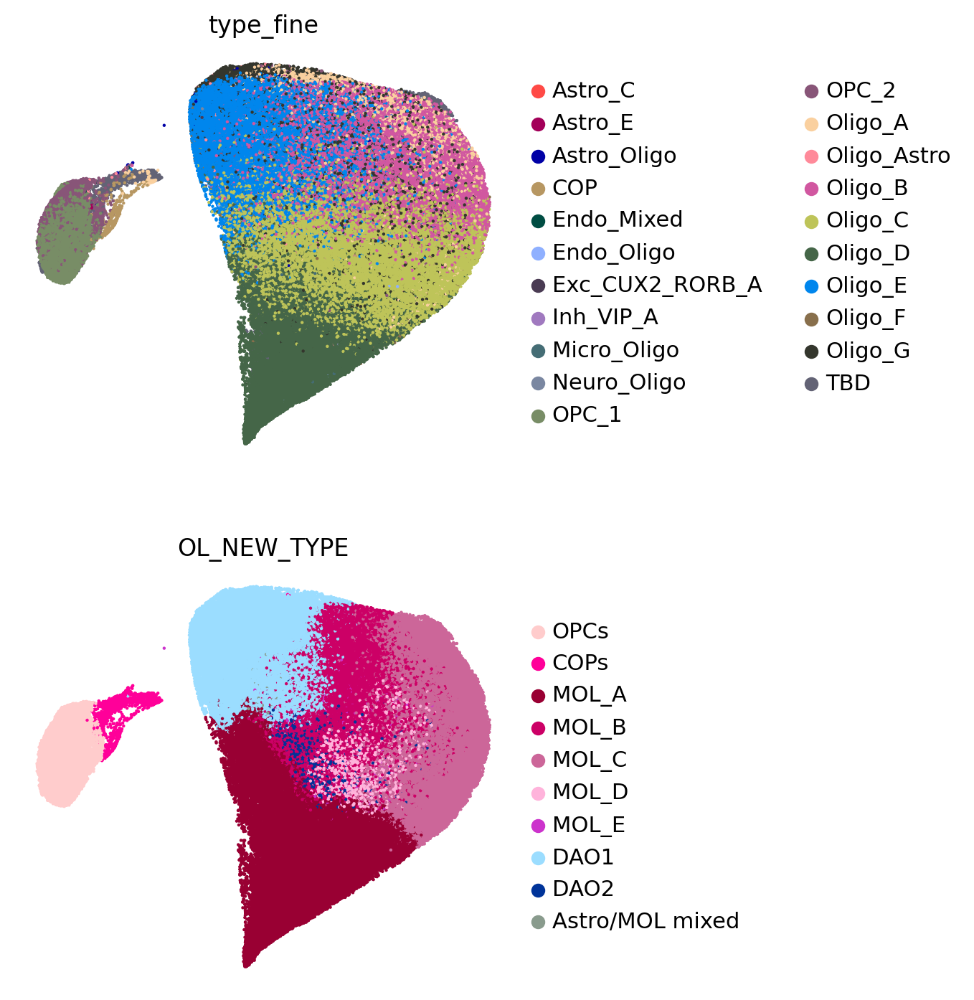

In [28]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["type_fine", "OL_NEW_TYPE"],
    frameon=False,
    ncols=1,
    s=10
)

In [29]:
# Unique values in the 'condition' column
unique_conditions = adata.obs['sys_OL_reduced2'].unique()
for condition in unique_conditions:
    print(condition)

COPs

MOL_2

OPCs

MOL_6

MOL_5

MOL_0

32

MOL_3

MOL_1

MOL_4

29

# Final naming

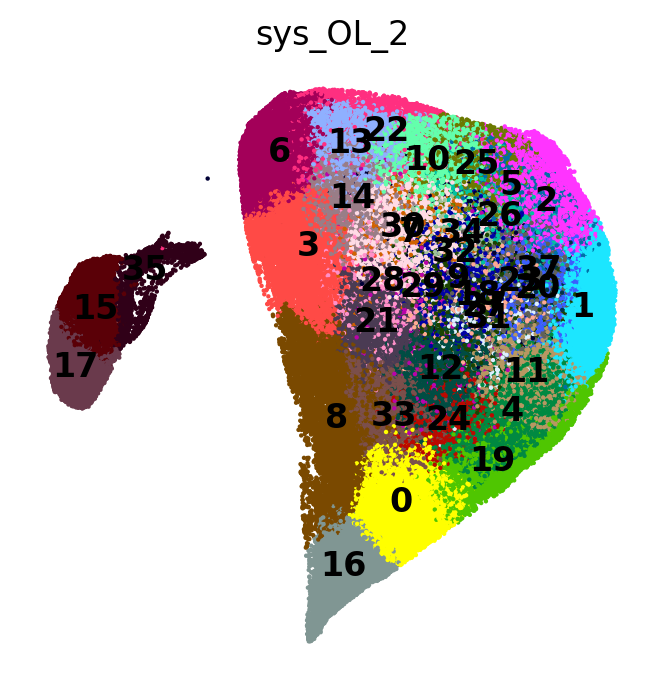

In [30]:
sc.pl.embedding(
    adata,
    basis='X_umap',
    color=["sys_OL_2"],
    s=10,
    frameon=False,
    ncols=2,
    legend_loc='on data'
)

In [33]:
# Define the desired order
leiden_order = [24, 27, 31, 8, 28, 7, 21, 4, 20, 11, 12, 25, 34, 5, 1, 37, 2, 23, 18, 26,
                10, 9, 30, 29, 32, 0, 16, 19, 33, 3, 6, 22, 13, 14, 35, 15, 17
]

# Convert leiden_new to a categorical type, storing in a new column
adata.obs['leiden_ordered'] = pd.Categorical(
    adata.obs['sys_OL_2_int'], categories=leiden_order, ordered=True
)

# Check if it worked
print(adata.obs['leiden_ordered'].value_counts())

leiden_ordered
0     11579
1     10622
2     10620
3     10413
4     10160
5     10145
6      9923
7      9559
8      9206
9      8257
10     8152
11     8142
12     7924
13     7913
14     7675
15     7370
16     7169
17     6971
18     6589
19     6575
20     5885
21     5772
22     5759
23     5587
24     5494
25     5411
26     4681
27     4353
28     4028
29     3971
30     3542
31     3292
32     3240
33     3149
34     2480
35     2388
37     1229
Name: count, dtype: int64

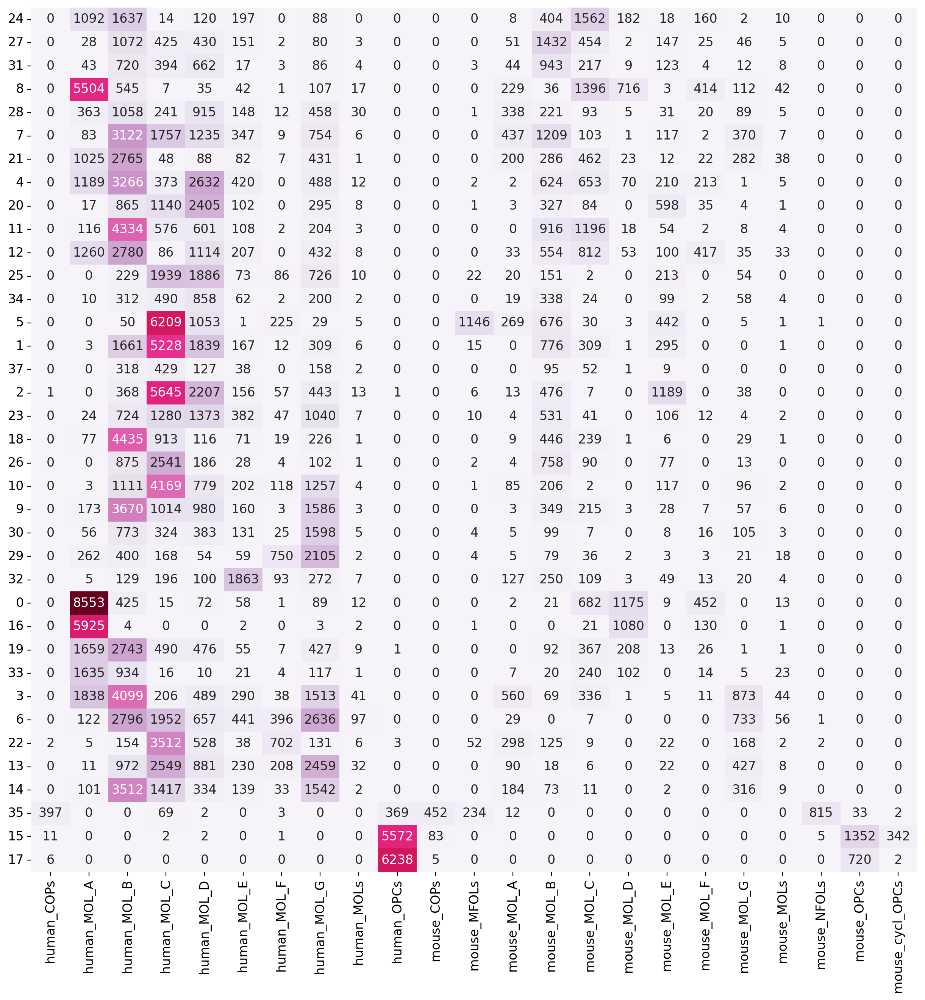

In [34]:
import seaborn as sb

# Create the crosstab
crosstab_df = pd.crosstab(adata.obs.leiden_ordered, adata.obs.organism_cluster)

# Create the heatmap
plt.figure(figsize=(15, 15))  # Adjust the figure size
ax = sb.heatmap(
    crosstab_df, 
    cmap="PuRd", 
    annot=True, 
    fmt="d", 
    cbar=False,  # Enable color bar (scale bar)
    square=False, 
    cbar_kws={"shrink": 0.8, "label": "Count"}  # Customize color bar
)

# Remove grid lines
ax.grid(False)

# Remove axis labels (titles)
ax.set_xlabel(None)
ax.set_ylabel(None)

# Rotate tick labels for better visibility
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='y', rotation=0)

# Save the figure
#plt.savefig('./figures_OL/crosstab_cluster_annotation_vs_diagnosis.png', dpi=300, bbox_inches='tight')

# Show the heatmap
plt.show()

In [68]:
#cell_type = {str(i): '' for i in range(18)}
cell_type = {'0': 'MOL_1',
 '1': 'MOL_2',
 '2': 'MOL_2',
 '3': 'DAO',
 '4': 'MOL_2',
 '5': 'MOL_2',
 '6': 'DAO',
 '7': 'MOL_2',
 '8': 'MOL_1',
 '9': 'MOL_2',
 '10': 'MOL_2',
 '11': 'MOL_2',
 '12': 'MOL_2',
 '13': 'DAO',
 '14': 'DAO',
 '15': 'OPCs',
 '16': 'MOL_1',
 '17': 'OPCs',
 '18': 'MOL_2',
 '19': 'MOL_1',
 '20': 'MOL_2',
 '21': 'MOL_2',
 '22': 'DAO',
 '23': 'MOL_2',
 '24': 'MOL_1',
 '25': 'MOL_2',
 '26': 'MOL_2',
 '27': 'MOL_2',
 '28': 'MOL_2',
 '29': 'DAO',
 '30': 'DAO',
 '31': 'MOL_2',
 '32': 'hs_MOL_E',
 '33': 'MOL_1',
 '34': 'MOL_2',
 '35': 'COPs',
 '37': 'MOL_2'
}

adata.obs['OL_annotation'] = adata.obs['sys_OL_2'].map(cell_type).astype('category')

In [69]:
# Check if it worked
print(adata.obs['OL_annotation'].value_counts())

OL_annotation
MOL_2       132888
DAO          49196
MOL_1        43172
OPCs         14341
hs_MOL_E      3240
COPs          2388
Name: count, dtype: int64

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_OL_annotation']`


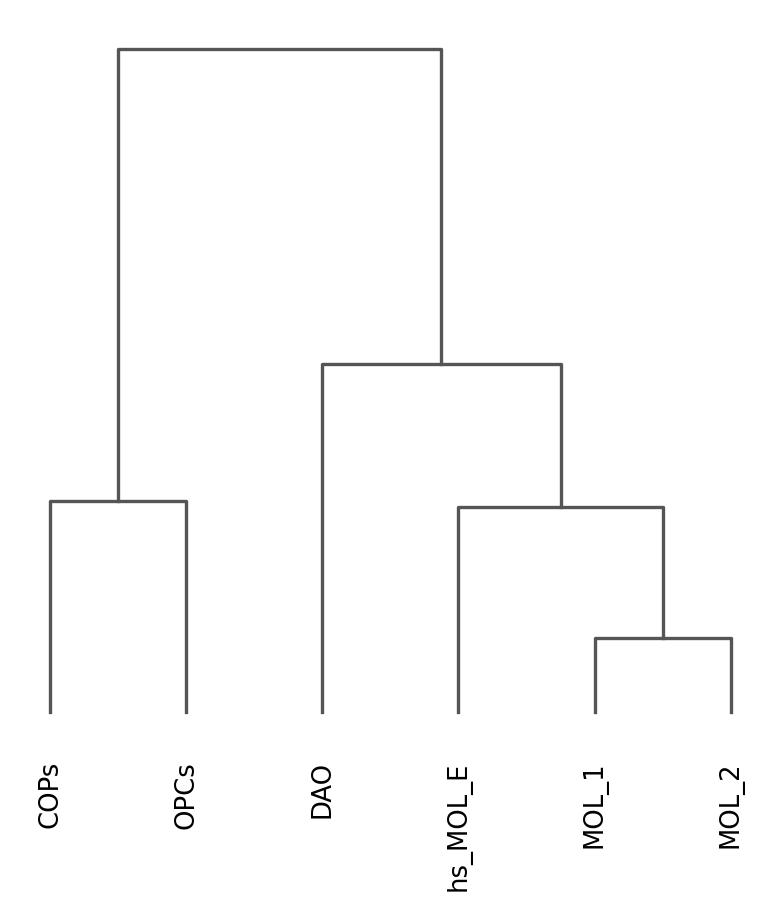

<Axes: >

In [70]:
sc.tl.dendrogram(adata, "OL_annotation")
sc.pl.dendrogram(adata, "OL_annotation")

In [77]:
# Define the desired order of lesion types
lesion_order = ["OPCs", "COPs", "MOL_1", "MOL_2", "hs_MOL_E", "DAO"]

# Convert lesion_type column to categorical with the specified order
adata.obs['OL_annotation'] = pd.Categorical(
    adata.obs['OL_annotation'], 
    categories=lesion_order, 
    ordered=True
)

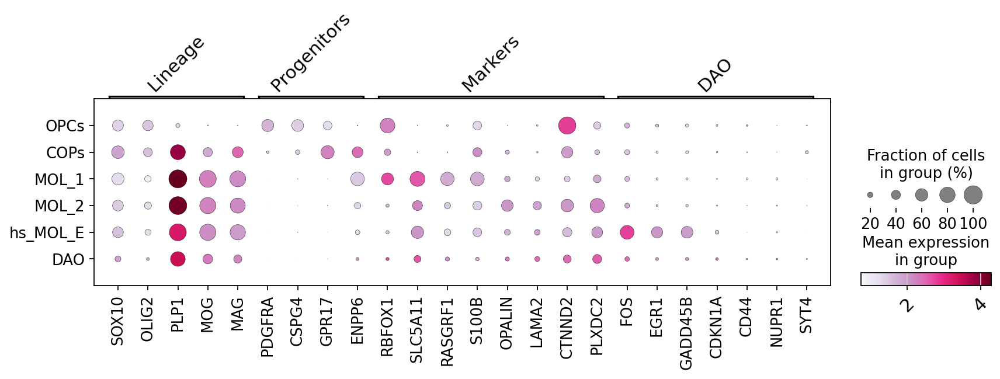

In [78]:
marker_genes = {
    'Lineage': ['SOX10', 'OLIG2', 'PLP1', 'MOG', 'MAG'],
    'Progenitors': ['PDGFRA', 'CSPG4', 'GPR17', 'ENPP6'],
    'Markers': ['RBFOX1', 'SLC5A11', 'RASGRF1', 'S100B', 'OPALIN', 'LAMA2', 'CTNND2', 'PLXDC2'],
    'DAO': ['FOS', 'EGR1', 'GADD45B', 'CDKN1A', 'CD44', 'NUPR1', 'SYT4'],
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata,
        groupby="OL_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        #dot_min=0.1,  # Adjust the minimum dot size
        mean_only_expressed=True,
        #expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.00001)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.4) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
plt.savefig('./figures/CrossSpecies_dotplot_OL_DAO_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

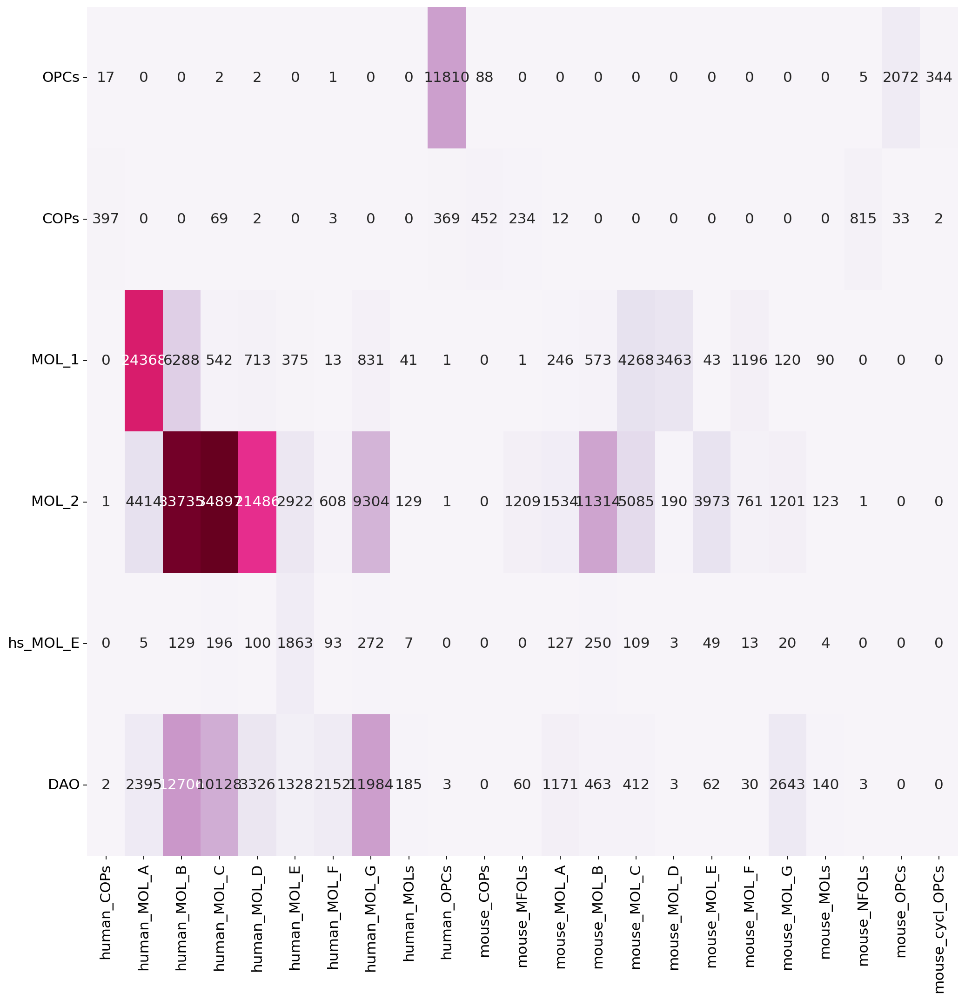

In [79]:
# Create the crosstab
crosstab_df = pd.crosstab(adata.obs.OL_annotation, adata.obs.organism_cluster)

# Create the heatmap
plt.figure(figsize=(15, 15))  # Adjust the figure size
ax = sb.heatmap(
    crosstab_df, 
    cmap="PuRd", 
    annot=True, 
    fmt="d", 
    cbar=False,  # Enable color bar (scale bar)
    square=False, 
    cbar_kws={"shrink": 0.8, "label": "Count"}  # Customize color bar
)

# Remove grid lines
ax.grid(False)

# Remove axis labels (titles)
ax.set_xlabel(None)
ax.set_ylabel(None)

# Rotate tick labels for better visibility
ax.tick_params(axis='x', rotation=90)
ax.tick_params(axis='y', rotation=0)

# Save the figure
plt.savefig('./figures/crosstab_h2m_annotation_vs_original.png', dpi=300, bbox_inches='tight')

# Show the heatmap
plt.show()

In [80]:
# Group by 'treatment_meta' and 'cell_type_eval' to count cells
cell_type_counts = adata.obs.groupby(['lesion_status_reduced', 'OL_annotation']).size().reset_index(name='cell_count')

# Pivot the DataFrame to have treatments as index and cell types as columns
pivoted_counts = cell_type_counts.pivot(index='OL_annotation', columns='lesion_status_reduced', values='cell_count').fillna(0)

# Add totals
total_cells = pivoted_counts.sum()

# Add percent
percent_counts = pivoted_counts.div(total_cells) * 100
percent_counts_transposed = percent_counts.transpose()
percent_counts_transposed

/tmp/1217280.1.gpu/ipykernel_1050036/647704865.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata.obs.groupby(['lesion_status_reduced', 'OL_annotation']).size().reset_index(name='cell_count')


OL_annotation,OPCs,COPs,MOL_1,MOL_2,hs_MOL_E,DAO
lesion_status_reduced,,,,,,
WM,5.448932,0.200447,22.196622,56.194272,2.974449,12.985278
NAWM,5.692449,0.426810,17.903670,56.457977,1.121616,18.397479
AL,8.440388,0.729593,10.385969,49.131641,0.280393,31.032016
CAL,5.733179,0.471007,15.998628,48.429458,0.237063,29.130665
CIL,5.230357,0.493953,15.783400,54.200905,1.380297,22.911089
RL,4.496965,0.244244,14.888115,57.167487,1.612729,21.590460
LPC_baseline,6.517180,1.443781,29.149863,55.355703,2.831102,4.702371
LPC_demyel,15.606122,11.316955,22.190898,45.207410,1.490133,4.188482
LPC_remyel,4.015714,1.236723,22.202823,69.489306,0.378292,2.677142


In [81]:
# Define the desired order of treatments and cell types
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL',
                           'LPC_baseline', 'LPC_demyel', 'LPC_remyel', 
                            'Cupr_baseline', 'Cupr_demyel', 'Cupr_remyel']
desired_cell_types_order = ['OPCs', 'COPs', 'MOL_1', 'MOL_2', 'hs_MOL_E', 'DAO']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)
percent_counts_reordered

OL_annotation,OPCs,COPs,MOL_1,MOL_2,hs_MOL_E,DAO
lesion_status_reduced,,,,,,
WM,5.448932,0.200447,22.196622,56.194272,2.974449,12.985278
NAWM,5.692449,0.426810,17.903670,56.457977,1.121616,18.397479
AL,8.440388,0.729593,10.385969,49.131641,0.280393,31.032016
CAL,5.733179,0.471007,15.998628,48.429458,0.237063,29.130665
CIL,5.230357,0.493953,15.783400,54.200905,1.380297,22.911089
RL,4.496965,0.244244,14.888115,57.167487,1.612729,21.590460
LPC_baseline,6.517180,1.443781,29.149863,55.355703,2.831102,4.702371
LPC_demyel,15.606122,11.316955,22.190898,45.207410,1.490133,4.188482
LPC_remyel,4.015714,1.236723,22.202823,69.489306,0.378292,2.677142


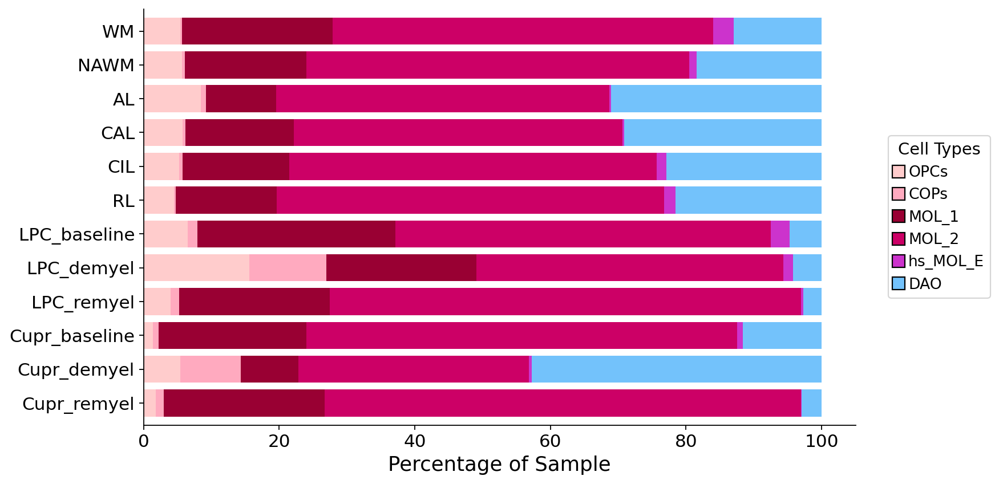

In [82]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'OPCs': '#ffcccc',
    'COPs': '#ffaabf',
    'MOL_1': '#990033',
    'MOL_2': '#cc0066',
    'hs_MOL_E': '#cc33cc',
    'DAO': '#73c2fb'
}

# Define the colors for the stacked bar chart in the order of desired_cell_types_order_updated
colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Show only x and y axis lines
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

# Create legend with dark grey border around color blocks
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]

# Adjust legend position
ax.legend(legend_handles, percent_counts_reordered.columns, loc='center right', fontsize=12, title='Cell Types', bbox_to_anchor=(1.2, 0.5), title_fontsize='13')
#ax.legend(legend_handles, percent_counts_reordered.columns, loc='center right', fontsize=12, title='Cell Types', title_fontsize='13')


# Save the plot as a PNG file
plt.savefig('./figures/cell_types_barh_NEW.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

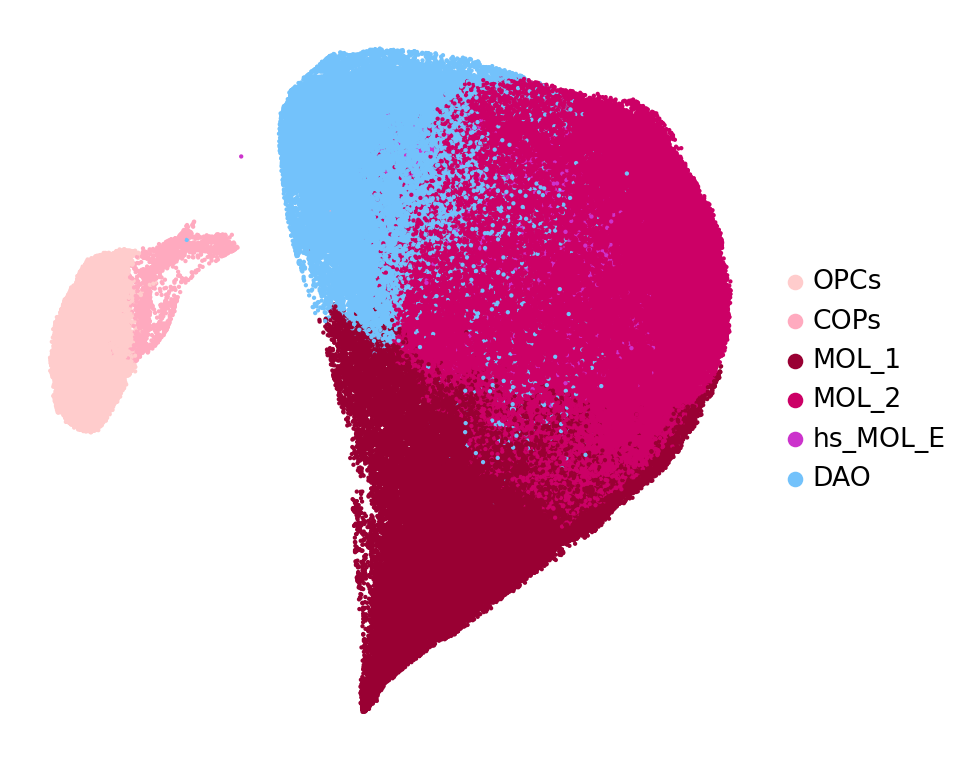

In [83]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=600, figsize=(6, 6), transparent=True)  # Increase dpi_save to 600

cluster_color = {
    'OPCs': '#ffcccc',
    'COPs': '#ffaabf',
    'MOL_1': '#990033',
    'MOL_2': '#cc0066',
    'MOL_C': '#cc6699',
    'hs_MOL_E': '#cc33cc',
    'hs_MOL_G': '#003399',
    'DAO': '#73c2fb'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_annotation'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=15,
           legend_fontweight= 'bold', title='', frameon= False , 
           legend_fontoutline=1, save='_h2m_sysVI_OL_lineage.png')

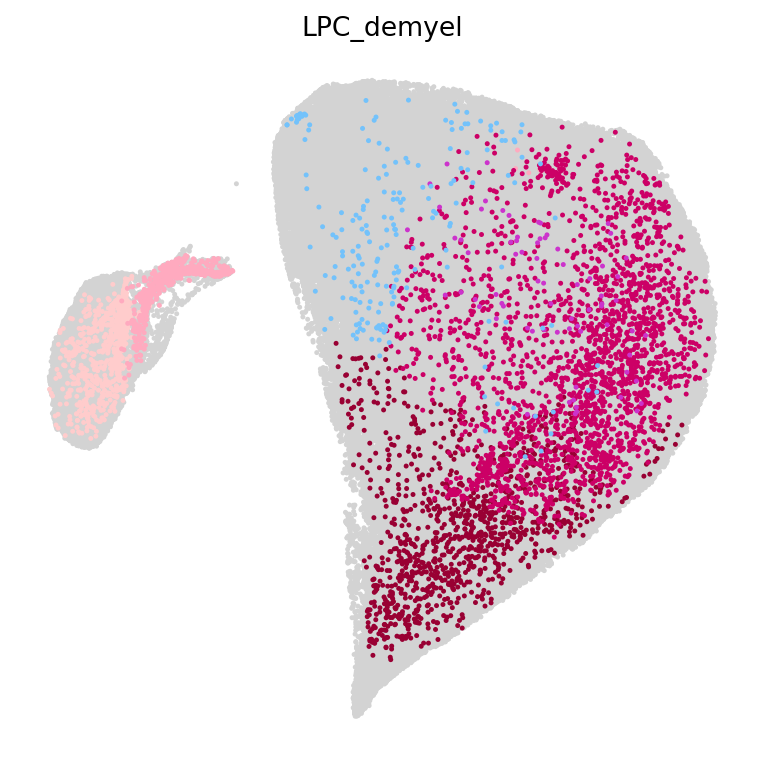

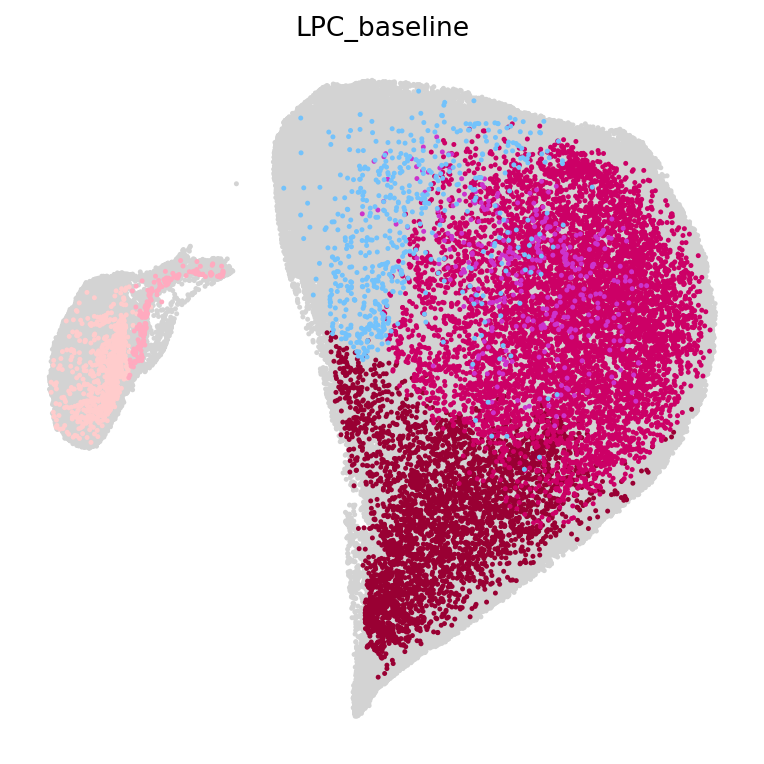

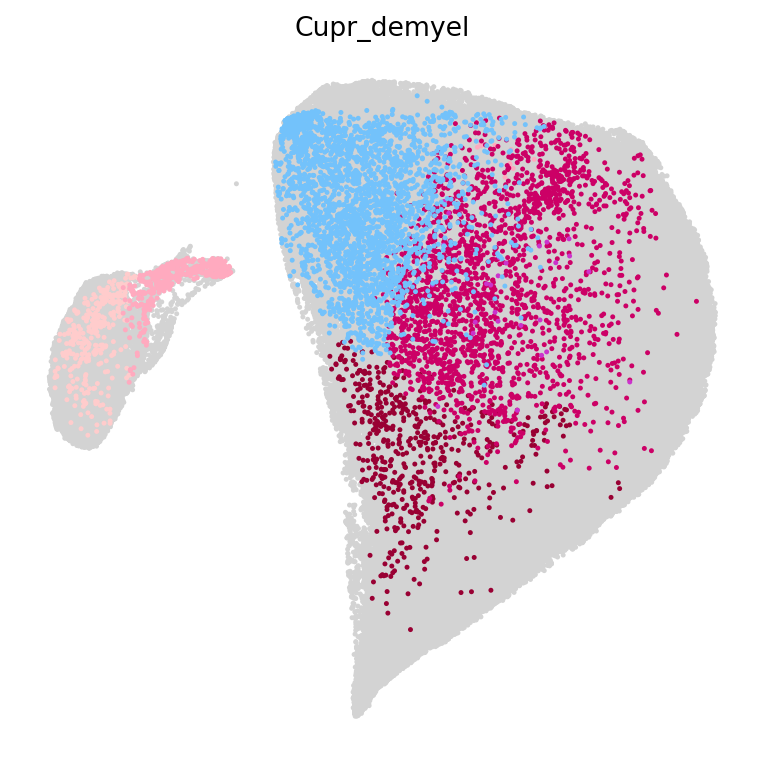

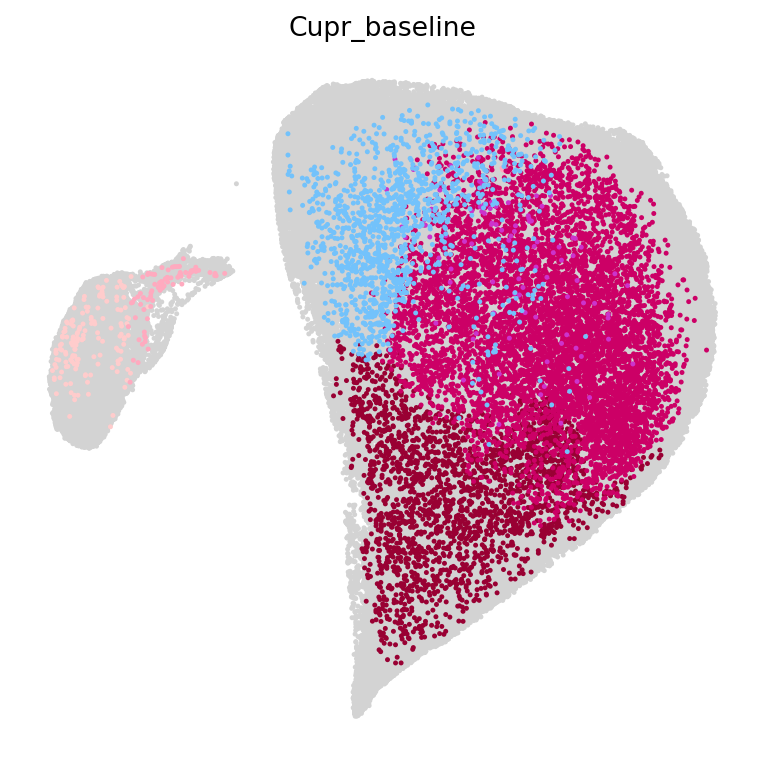

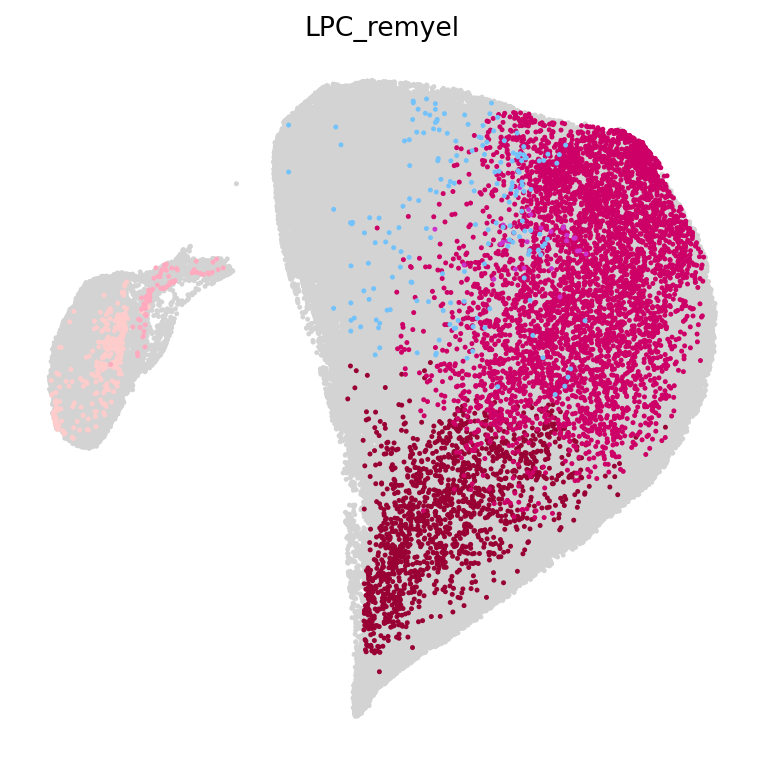

...

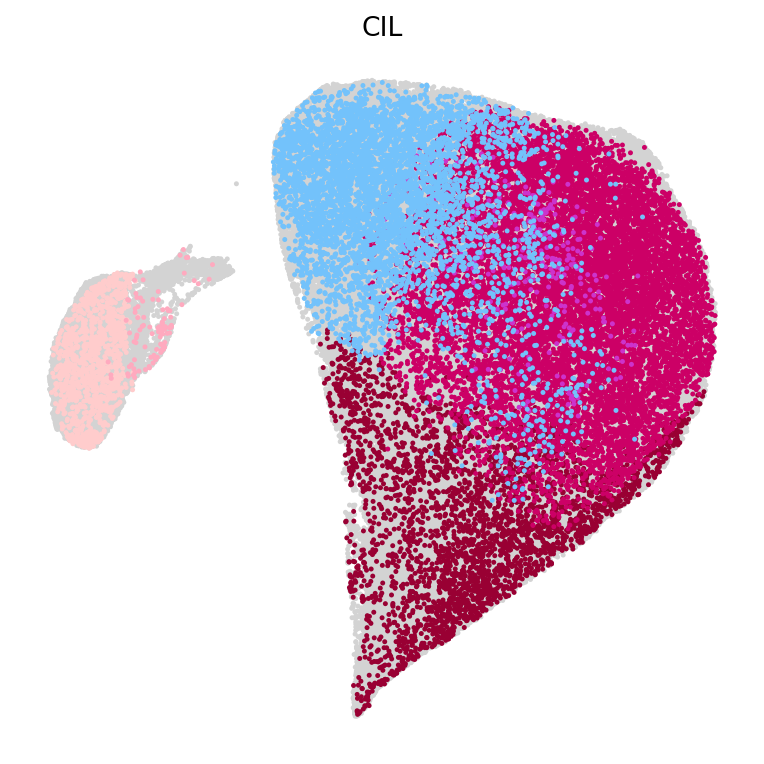

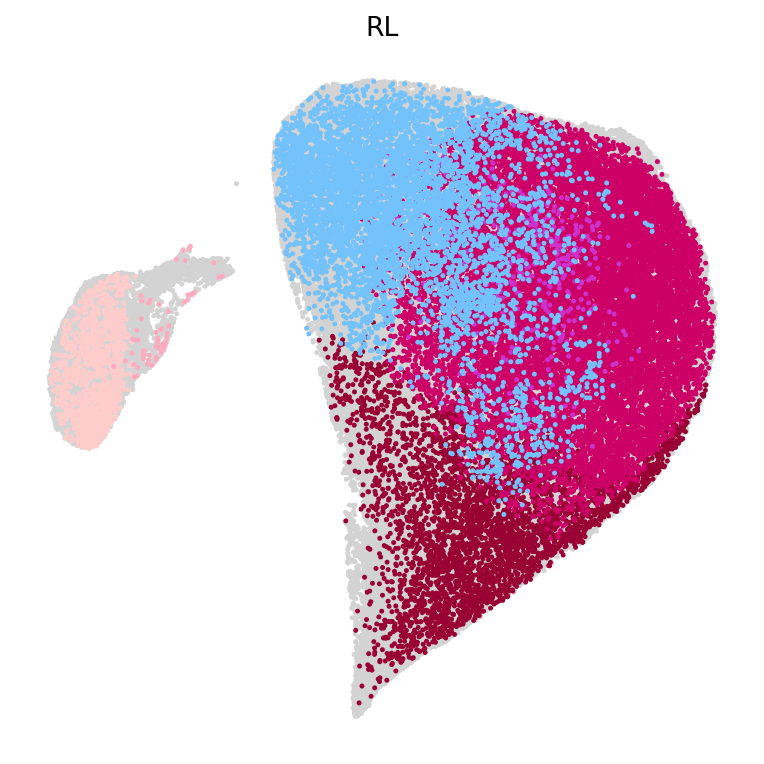

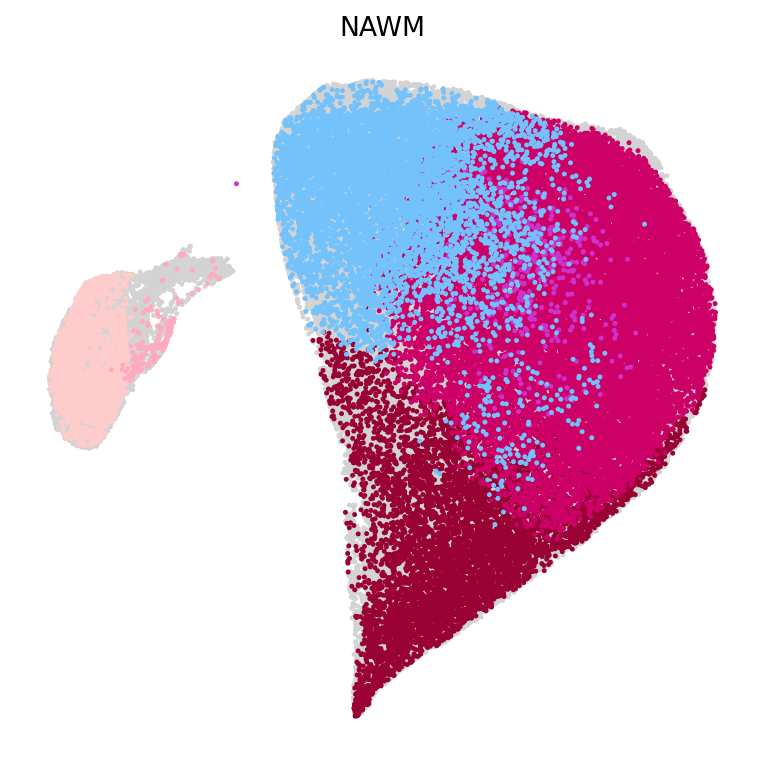

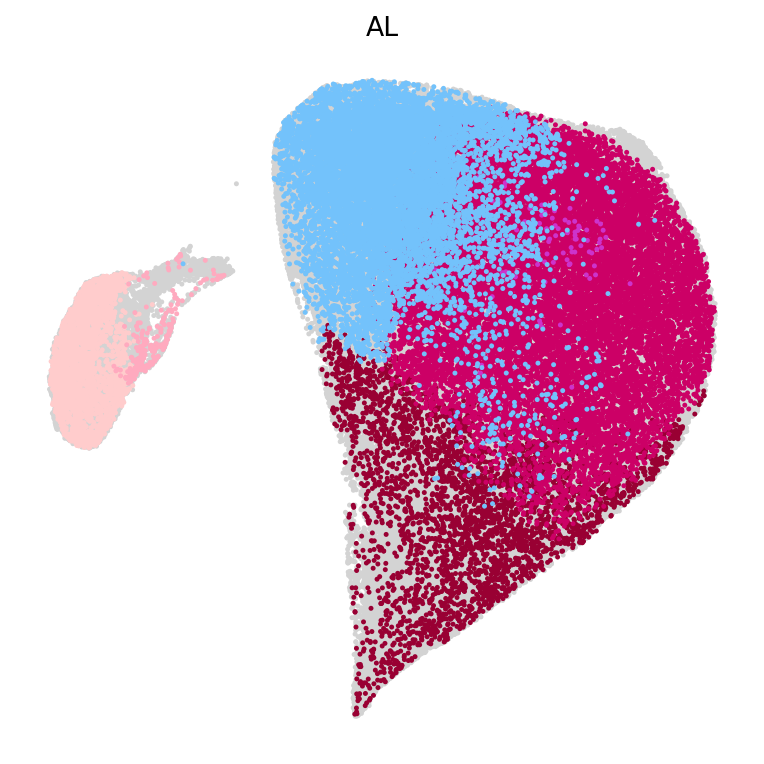

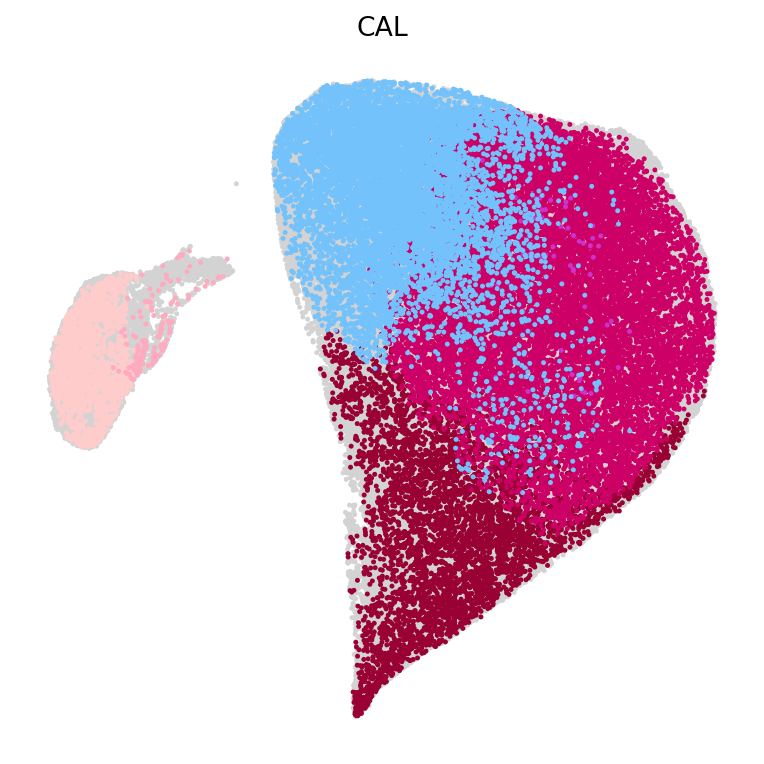

In [84]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

cluster_color = {
    'OPCs': '#ffcccc',
    'COPs': '#ffaabf',
    'MOL_1': '#990033',
    'MOL_2': '#cc0066',
    'hs_MOL_E': '#cc33cc',
    'hs_MOL_G': '#003399',
    'DAO': '#73c2fb'
}
# Set a grey color for cells not in the current lesion_status
grey_color = '#d3d3d3'

# Iterate over unique lesion_statuses
for lesion_status in adata.obs['lesion_status_reduced'].unique():
    # Create a mask for cells in the specific lesion_status
    lesion_mask = adata.obs['lesion_status_reduced'] == lesion_status

    # Initialize color vector for cells not in the lesion_status
    colors = np.array([grey_color] * adata.shape[0])  # Initialize all to grey

    # Plot UMAP with grey dots first
    plt.figure(figsize=(5, 5))  # Ensure figure size matches settings
    umap_coords = adata.obsm['X_umap']
    grey_mask = ~lesion_mask
    plt.scatter(umap_coords[grey_mask, 0], umap_coords[grey_mask, 1], 
                color=grey_color, s=5, edgecolor='none')

    # Overlay cell type colors on top
    for cell_type in cluster_color:
        # Assign the specific cluster color for cells of the current type in the lesion_status
        cell_type_mask = (adata.obs['OL_annotation'] == cell_type) & lesion_mask
        plt.scatter(umap_coords[cell_type_mask, 0], umap_coords[cell_type_mask, 1], 
                    color=cluster_color[cell_type], s=5, edgecolor='none')

    # Customize plot appearance
    plt.title(f"{lesion_status}", fontsize=12)  # Ensure title is added with fontsize
    plt.xlabel('UMAP 1')
    plt.ylabel('UMAP 2')
    
    # Remove grid and axes
    plt.grid(False)
    plt.gca().set_axis_off()

    # Save the plot with specified parameters
    plt.tight_layout()
    plt.savefig(f"{sc.settings.figdir}/{lesion_status}_combined_umap.png", dpi=300, transparent=True)

    # Show the plot in the console
    plt.show()

    # Close the plot
    plt.close()

## Add gene signatures

In [55]:
pandey_genes = ['IFI47', 'IIGP1', 'MDFIC', 'TOP2A', 'DYNLT1A', 'LGALS1', 
                                'CXCL10', 'OASL1', 'ZBP1', 'DHX58', 'TRIM25', 'RSAD2', 'SLFN9', 
                                'OAS1A', 'IFITM2', 'BCL3', 'IFI27L2A', 'OASL2',  'IRF7', 'IFIT1', 
                                'BST2', 'ISG15', 'IFIT3B', 'IFIT3', 'IFITM3', 'RTP4']

sc.tl.score_genes(adata, pandey_genes, score_name='Pandey_DA_signature')

computing score 'Pandey_DA_signature'
    finished: added
    'Pandey_DA_signature', score of gene set (adata.obs).
    650 total control genes are used. (0:00:22)


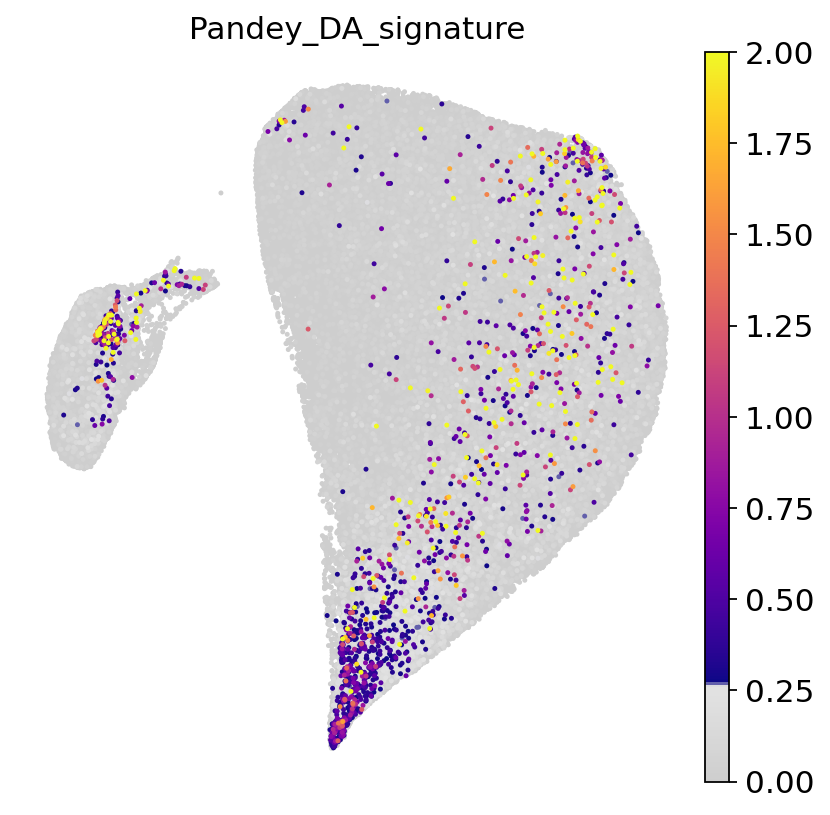

In [56]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['Pandey_DA_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20)
          #save=today+'_Pandey_DA_sig.png')

In [57]:
cupr_genes = ['SYT4', 'NUPR1','TENM4', 'TRIB3', 'MOXD1', 'GDF15', 'SLC7A5', 'CYB5R2', 'SOX2',
              'DNAL4', 'SMPD3', 'DDIT3', 'ATF4', 'EDA2R', 'COX20', 'CEBPG', 'CDH6',  
              'CHCHD10', 'FRMD4A', 'CD44', 'VEGFA', 'XYLT1', 'PTCH1', 'SMN1']

sc.tl.score_genes(adata, cupr_genes, score_name='Cupr_signature')

computing score 'Cupr_signature'
    finished: added
    'Cupr_signature', score of gene set (adata.obs).
    500 total control genes are used. (0:01:47)


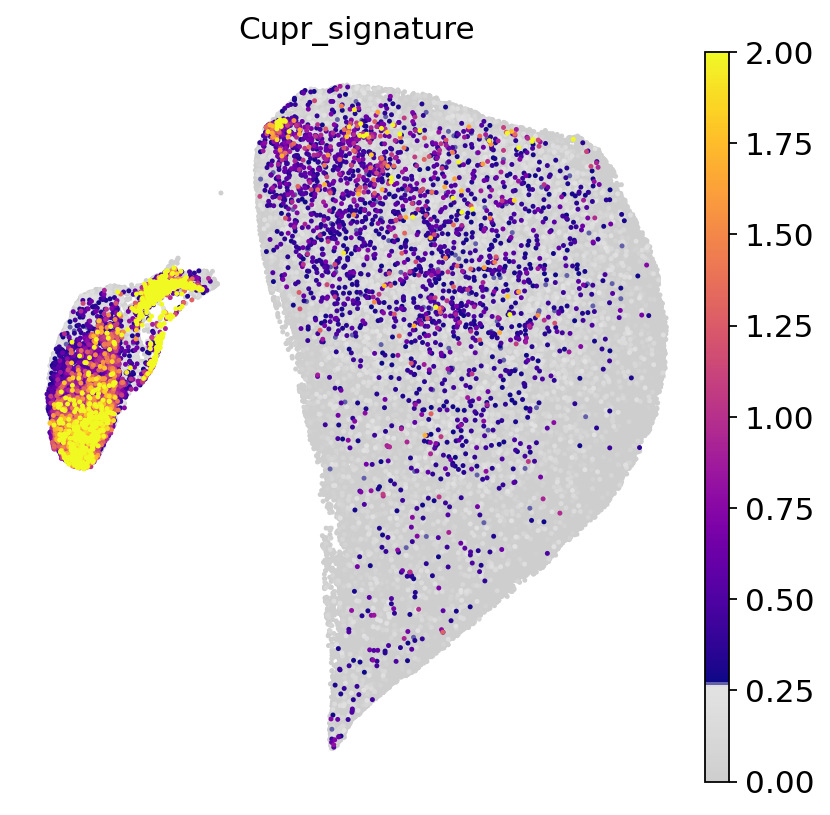

In [58]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['Cupr_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_h2m_Cupr_DA_sig.png')

In [59]:
lpc_genes = ['KLK8', 'BCAN', 'STEAP3', 'SOX5', 'NRCAM', 'PLVAP', 'CHL1', 'NAV3',  
             'FGFRL1', 'SEMA4F', 'TSPAN4', 'AMOTL1', 'IFIT1', 'OASL2', 'PIEZO2', 'ANXA2',  
             'SOCS3', 'GBP3', 'MMD2', 'USP18', 'NPB', 'FAM124A', 'DDX60', 'BCL3',  
             'RALGPS2', 'PDZRN4', 'APBA2', 'IFI27L2A', 'C4B', 'NNAT', 'SNX10', 'RASIP1',  
             'CACHD1', 'MASP1', 'PARP3', 'KCNIP1', 'PROS1']

sc.tl.score_genes(adata, lpc_genes, score_name='LPC_signature')

computing score 'LPC_signature'
    finished: added
    'LPC_signature', score of gene set (adata.obs).
    650 total control genes are used. (0:02:09)


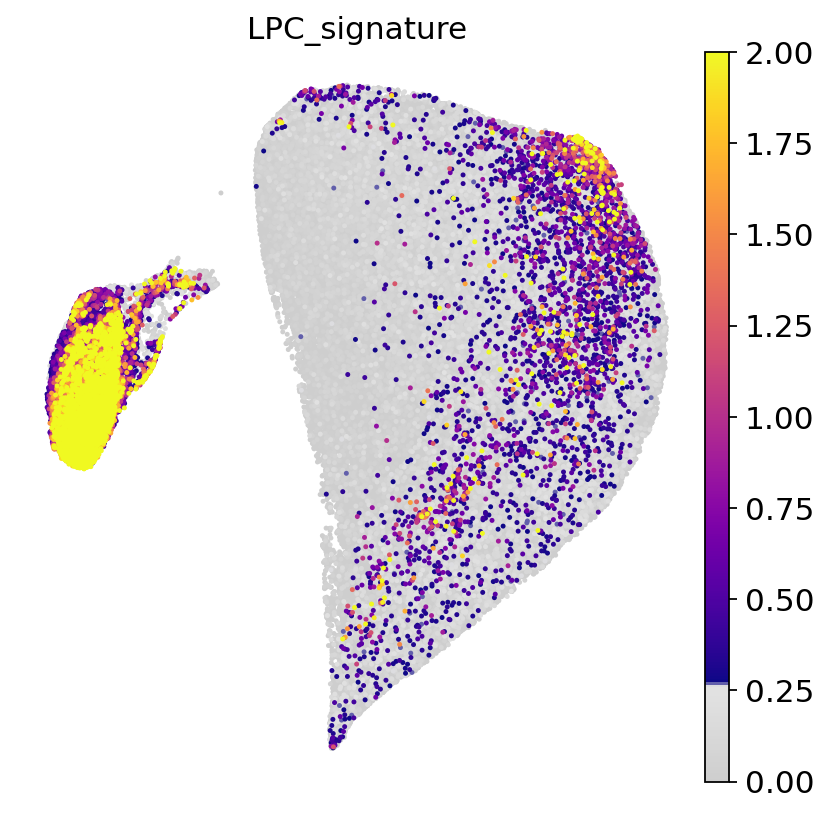

In [60]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['LPC_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
           save='_h2m_LPC_DA_sig.png')

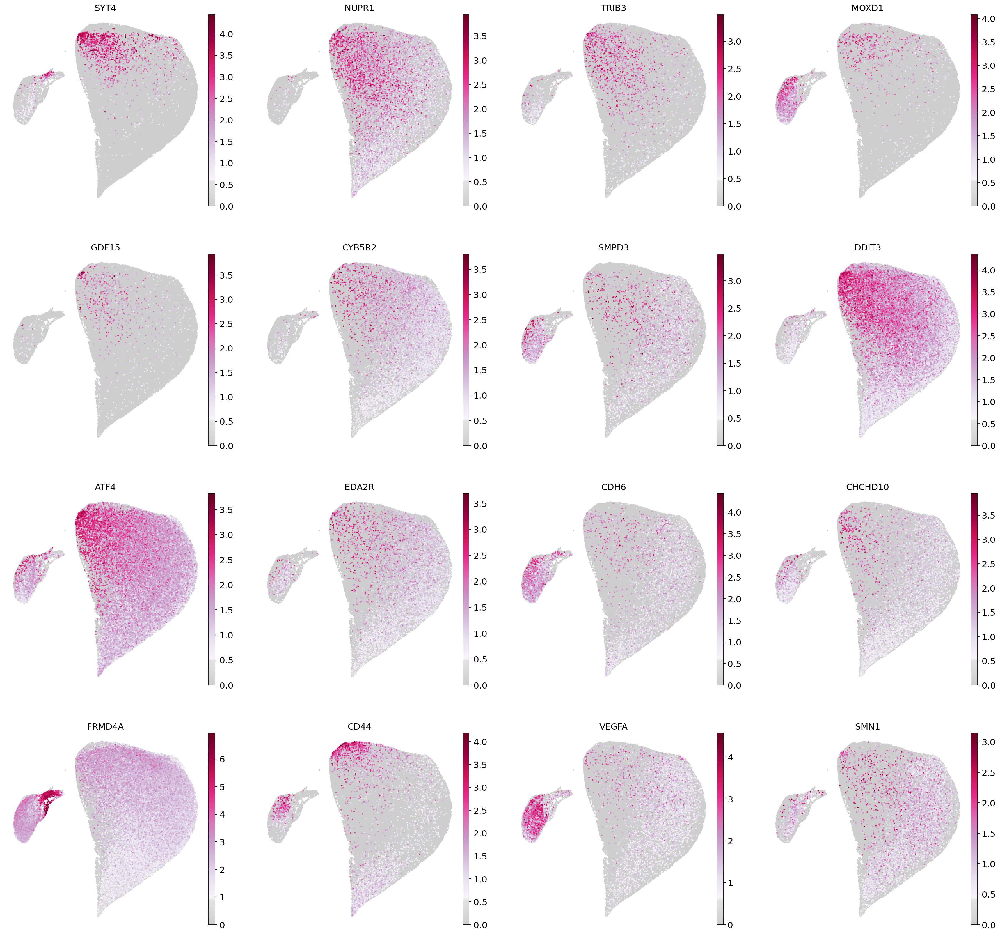

In [61]:
sc.pl.umap(adata, 
           color=['SYT4', 'NUPR1', 'TRIB3', 'MOXD1', 'GDF15', 'CYB5R2', 
              'SMPD3', 'DDIT3', 'ATF4', 'EDA2R', 'CDH6',  
              'CHCHD10', 'FRMD4A', 'CD44', 'VEGFA', 'SMN1'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=4, 
           frameon=False, 
           s=20, 
           legend_fontweight='bold', 
           legend_fontoutline=1,)
           #save='_H2M_OL_markers.png')

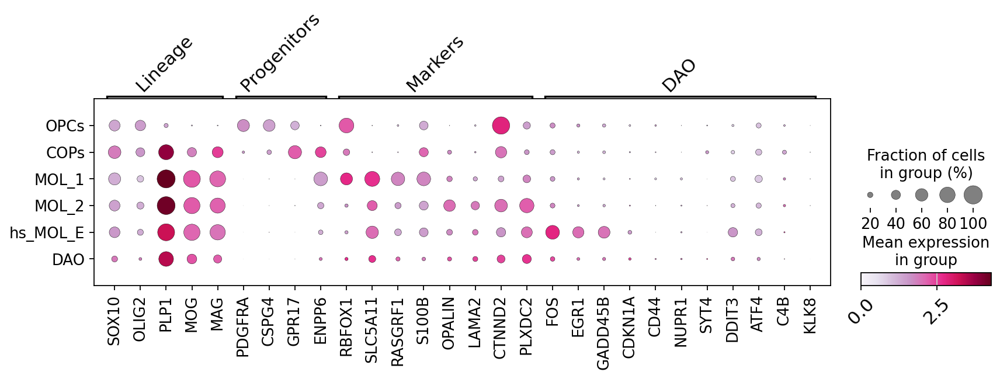

In [88]:
marker_genes = {
    'Lineage': ['SOX10', 'OLIG2', 'PLP1', 'MOG', 'MAG'],
    'Progenitors': ['PDGFRA', 'CSPG4', 'GPR17', 'ENPP6'],
    'Markers': ['RBFOX1', 'SLC5A11', 'RASGRF1', 'S100B', 'OPALIN', 'LAMA2', 'CTNND2', 'PLXDC2'],
    'DAO': ['FOS', 'EGR1', 'GADD45B', 'CDKN1A', 'CD44', 'NUPR1', 'SYT4', 'DDIT3', 'ATF4', 'C4B', 'KLK8'],
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata,
        groupby="OL_annotation",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        #dot_min=0.1,  # Adjust the minimum dot size
        mean_only_expressed=True,
        #expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.00001)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.4) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
#plt.savefig('./figures/CrossSpecies_dotplot_OL_DAO_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

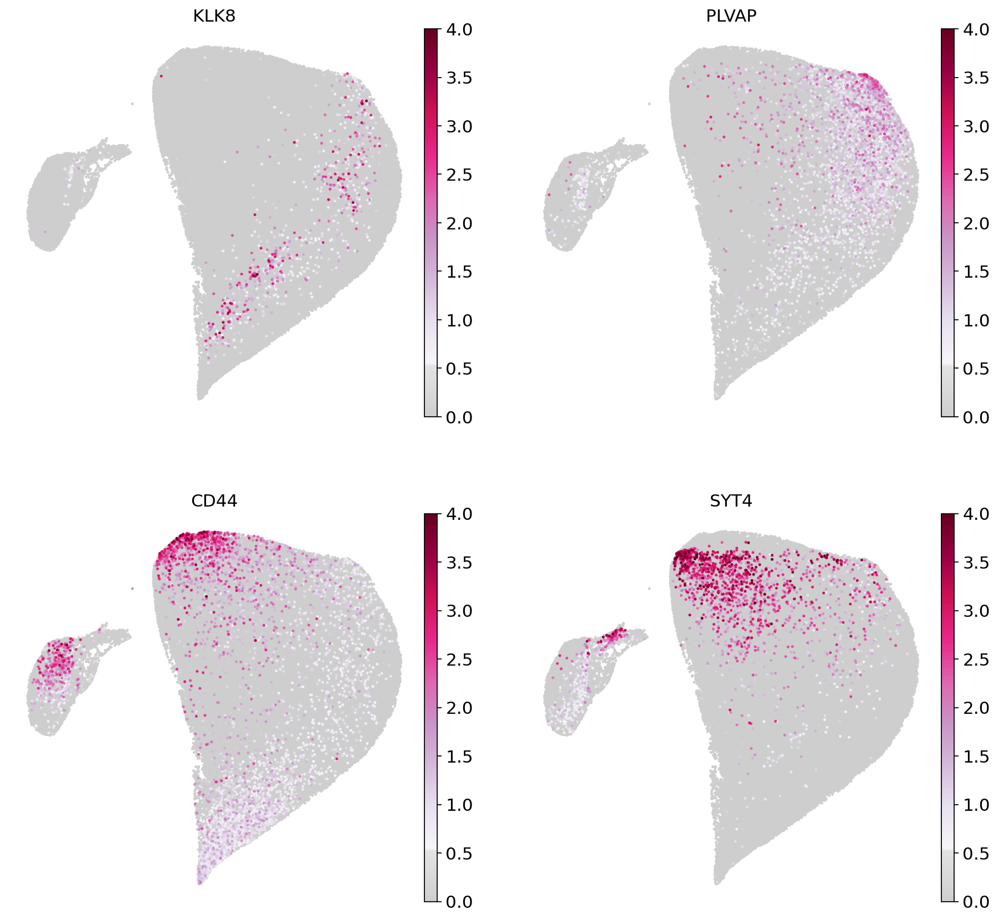

In [92]:
sc.pl.umap(adata, 
           color=['KLK8', 'PLVAP', 'CD44', 'SYT4'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=2, 
           frameon=False, 
           s=20, 
           vmax=4,
           legend_fontweight='bold', 
           legend_fontoutline=1,
           save='_H2M_DAO_markers.png')

In [63]:
adata.obs['lesion_status_reduced'].value_counts()

lesion_status_reduced
WM               43403
NAWM             40299
AL               34951
CAL              32059
RL               27841
CIL              21662
LPC_baseline     12398
Cupr_baseline    10812
LPC_remyel        6873
Cupr_demyel       6261
LPC_demyel        4966
Cupr_remyel       2443
Name: count, dtype: int64

In [64]:
AL = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='AL'],n_obs=1000,copy=True).obs_names
NAWM = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='NAWM'],n_obs=1000,copy=True).obs_names
CAL = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='CAL'],n_obs=1000,copy=True).obs_names
WM_hs = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='WM'],n_obs=1000,copy=True).obs_names
RL = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='RL'],n_obs=1000,copy=True).obs_names
CIL = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='CIL'],n_obs=1000,copy=True).obs_names

LPC_baseline = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='LPC_baseline'],n_obs=1000,copy=True).obs_names
LPC_demyel = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='LPC_demyel'],n_obs=1000,copy=True).obs_names
LPC_remyel = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='LPC_remyel'],n_obs=1000,copy=True).obs_names
#LPC_14dpl = sc.pp.subsample(adata[adata.obs['lesion_merged']=='LPC_14dpl'],n_obs=2429,copy=True).obs_names
Cupr_baseline = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='Cupr_baseline'],n_obs=1000,copy=True).obs_names
Cupr_demyel = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='Cupr_demyel'],n_obs=1000,copy=True).obs_names
Cupr_remyel = sc.pp.subsample(adata[adata.obs['lesion_status_reduced']=='Cupr_remyel'],n_obs=1000,copy=True).obs_names

In [65]:
adata_subsample = adata[list(LPC_baseline) + list(LPC_demyel) + list(LPC_remyel) +
                                list(Cupr_baseline) + list(Cupr_demyel) + list(Cupr_remyel) +
                                list(WM_hs) + list(NAWM) + list(AL) + list(CAL) + list(CIL) + list(RL)].copy()
adata_subsample.shape

(12000, 32250)

In [66]:
sc.tl.embedding_density(adata_subsample, basis='umap', groupby='lesion_status_reduced')

computing density on 'umap'
--> added
    'umap_density_lesion_status_reduced', densities (adata.obs)
    'umap_density_lesion_status_reduced_params', parameter (adata.uns)


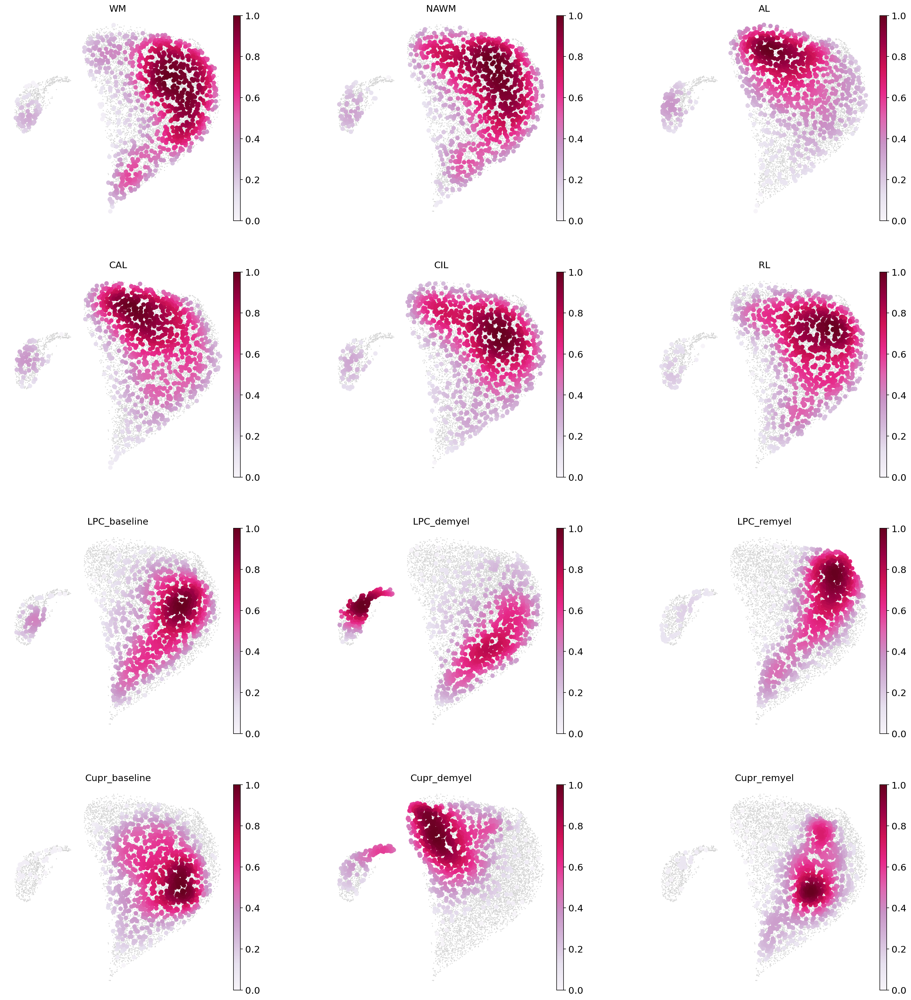

In [67]:
sc.pl.embedding_density(adata_subsample, basis='umap',  key='umap_density_lesion_status_reduced', color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, 
                        ncols=3, save='_NEW_OL_distribution_downscaling_lesion_merged_N1000.pdf')